In [1]:
import matplotlib.pyplot as plt
import pickle
from tools.results_functions import evaluate_system_comparison, show_dataset, get_camera_parameters, plot_LASA_S2, plot_accuracy_metrics
results_base_directory = './'

### Visualize LASA dataset

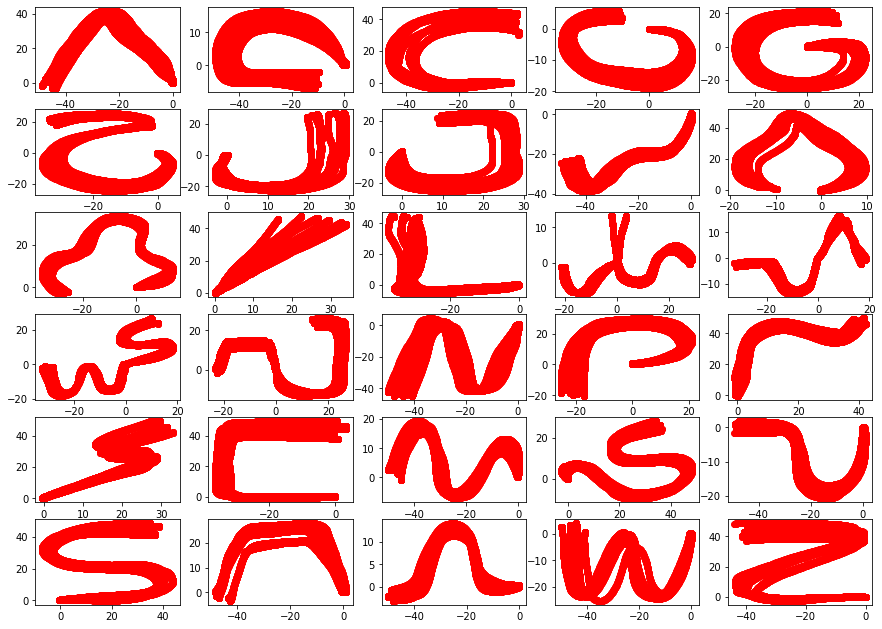

In [2]:
subplots = [6, 5]
figsize = [15, 11]
dataset_name = 'LASA'
show_dataset(dataset_name, subplots, figsize)

## 1) Experiments LASA

This section show that the proposed framework can successfully learn accurate and asymptotically stable motions from the LASA dataset.


###  1.1) Qualitative Comparison

In [3]:
plt.rcdefaults()
plt.rcParams.update({"text.usetex": True, 
                     "font.family": "Times New Roman", 
                     "font.size": 26,
                     "figure.figsize": (8, 9)})
dataset_name = 'LASA'
simulated_trajectory_length = 2000
density = 50
models_names = ['1st_order_2D', '1st_order_2D_euc', '1st_order_2D_boundary', '1st_order_2D_euc_boundary', '1st_order_behavioral_cloning_2D']
quanti_eval = False
quali_eval = True

Saving image to results_analysis/LASA_1st_order_2D_3.pdf...


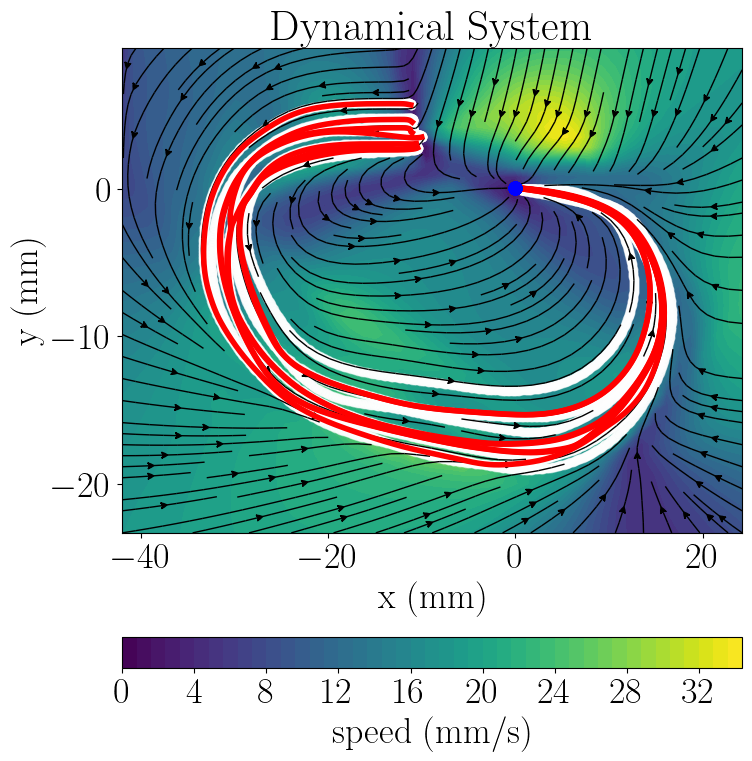

Saving image to results_analysis/LASA_1st_order_2D_23.pdf...


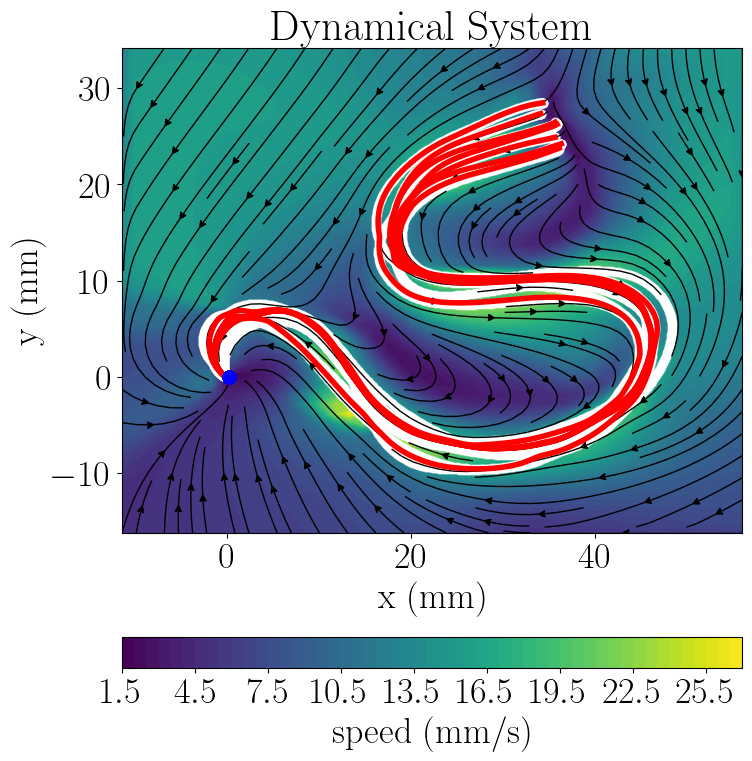

Saving image to results_analysis/LASA_1st_order_2D_25.pdf...


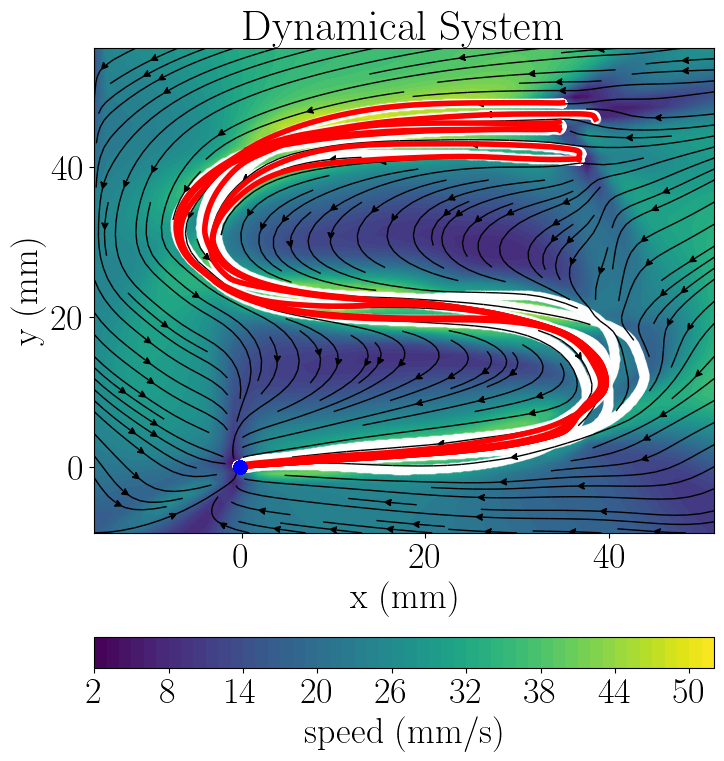

Saving image to results_analysis/LASA_1st_order_2D_euc_3.pdf...


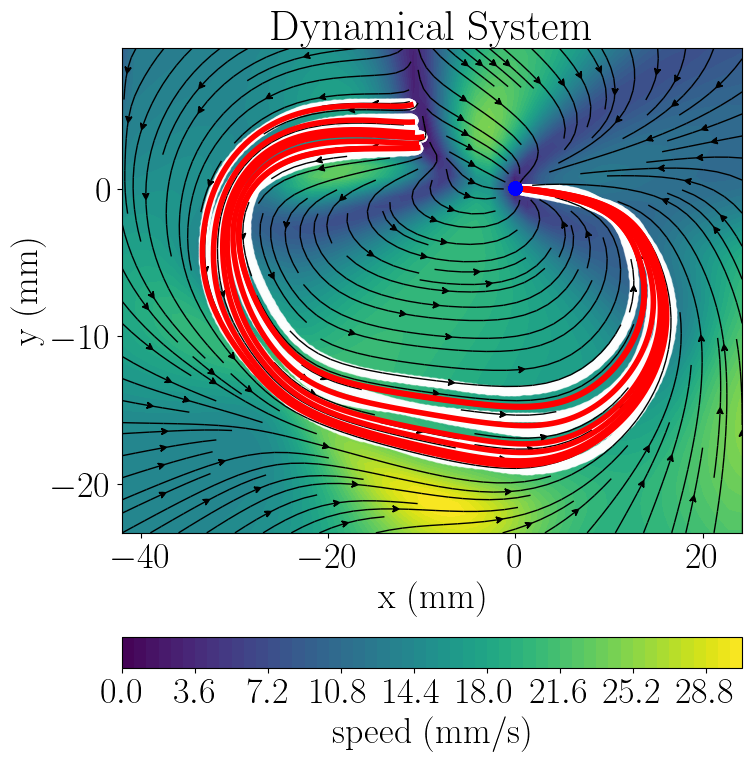

Saving image to results_analysis/LASA_1st_order_2D_euc_23.pdf...


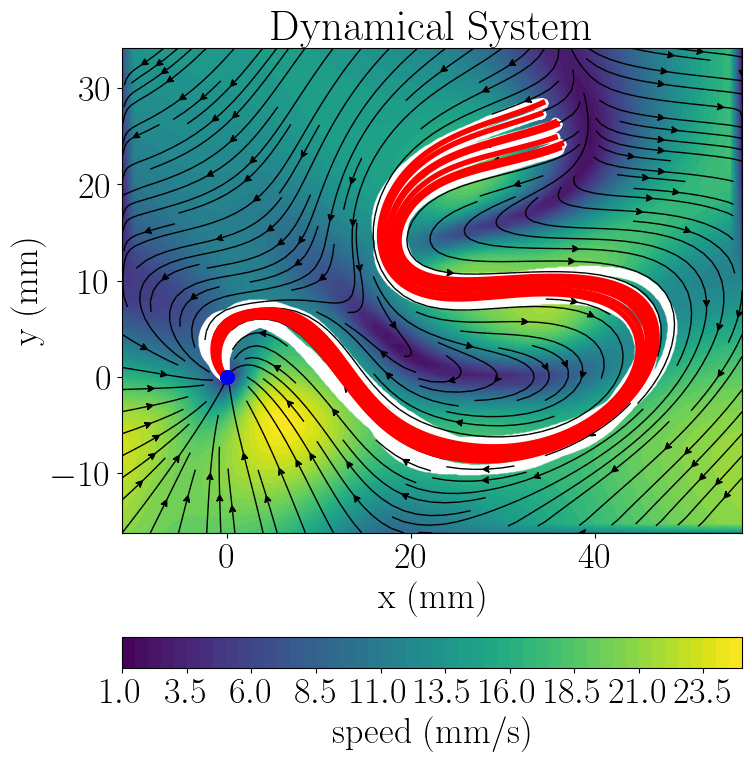

Saving image to results_analysis/LASA_1st_order_2D_euc_25.pdf...


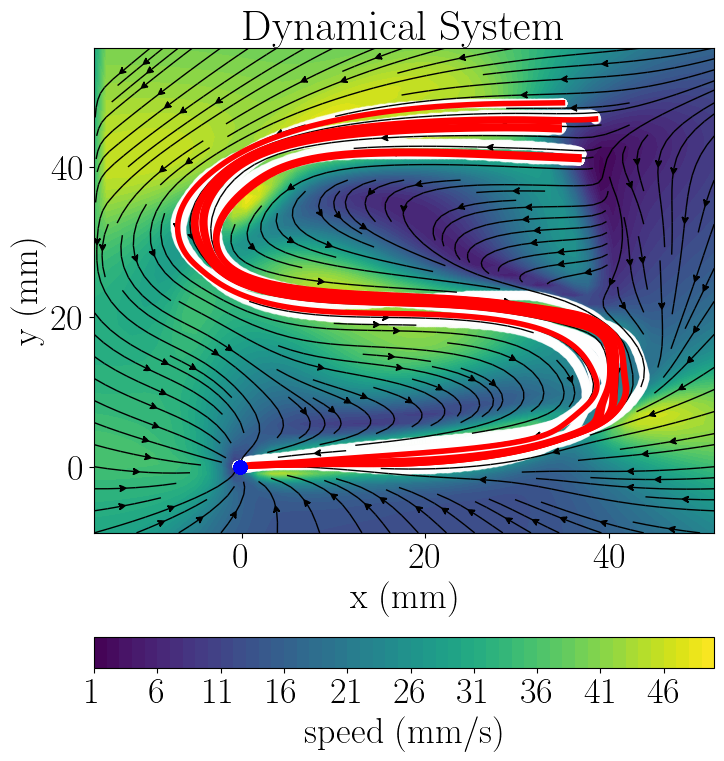

Saving image to results_analysis/LASA_1st_order_2D_boundary_3.pdf...


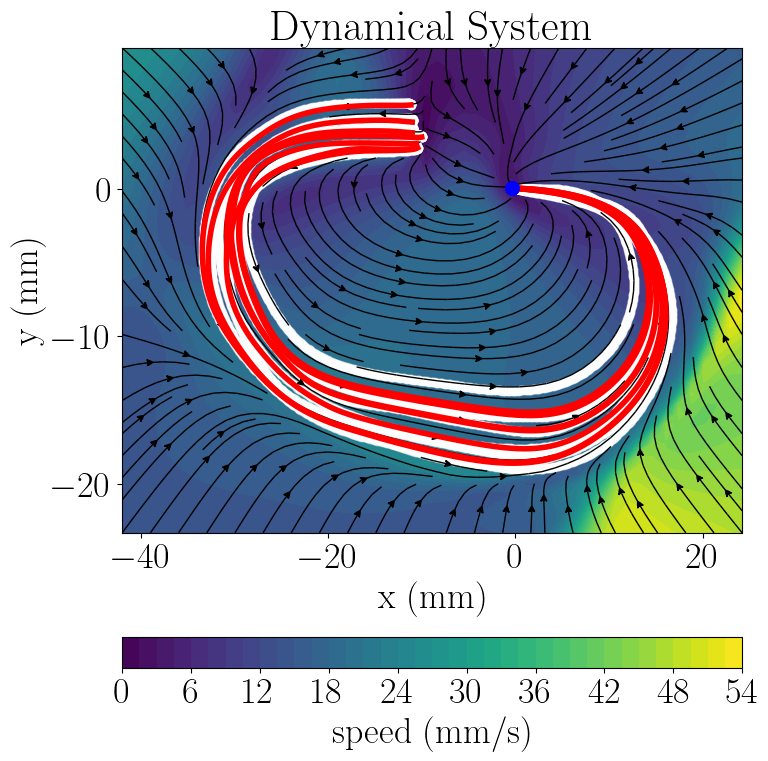

Saving image to results_analysis/LASA_1st_order_2D_boundary_23.pdf...


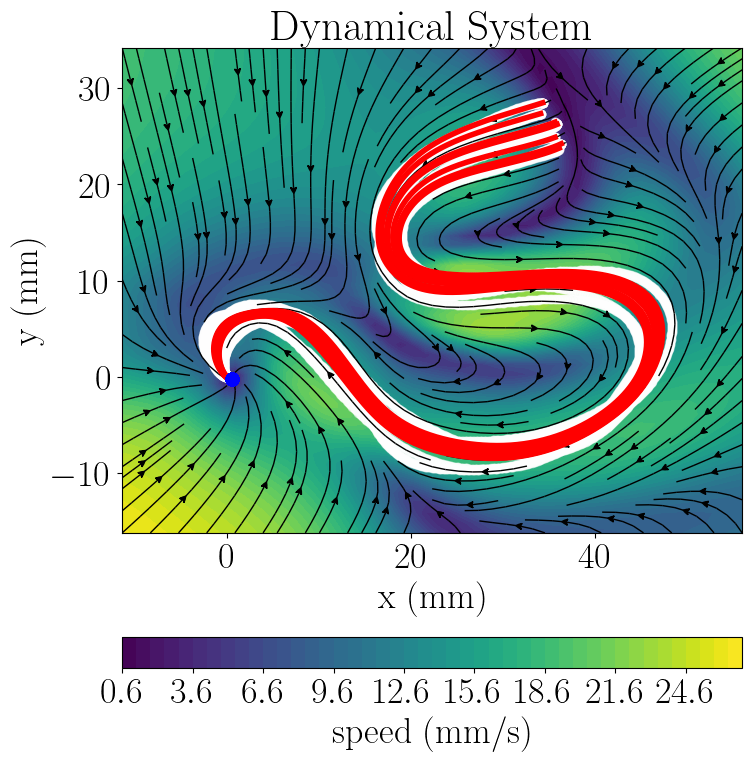

Saving image to results_analysis/LASA_1st_order_2D_boundary_25.pdf...


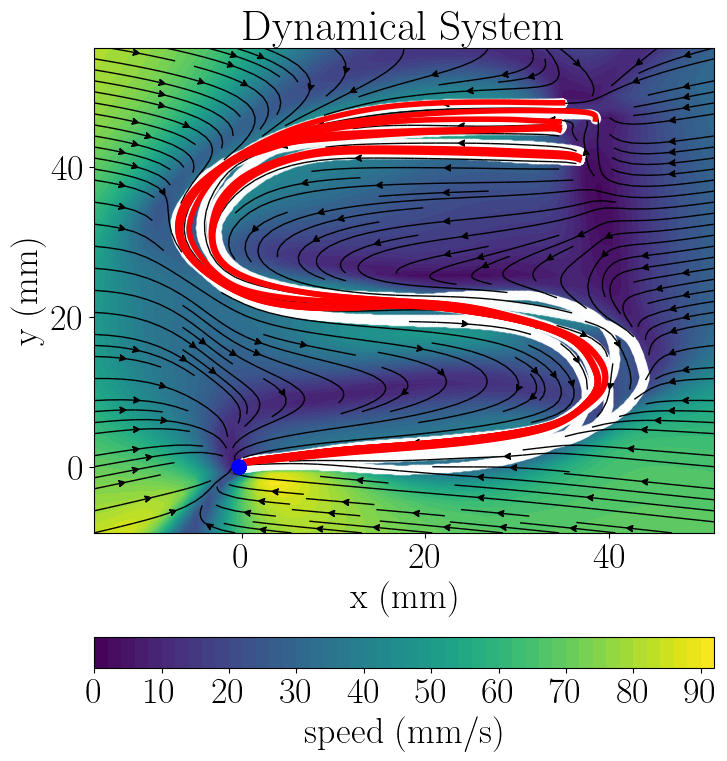

Saving image to results_analysis/LASA_1st_order_2D_euc_boundary_3.pdf...


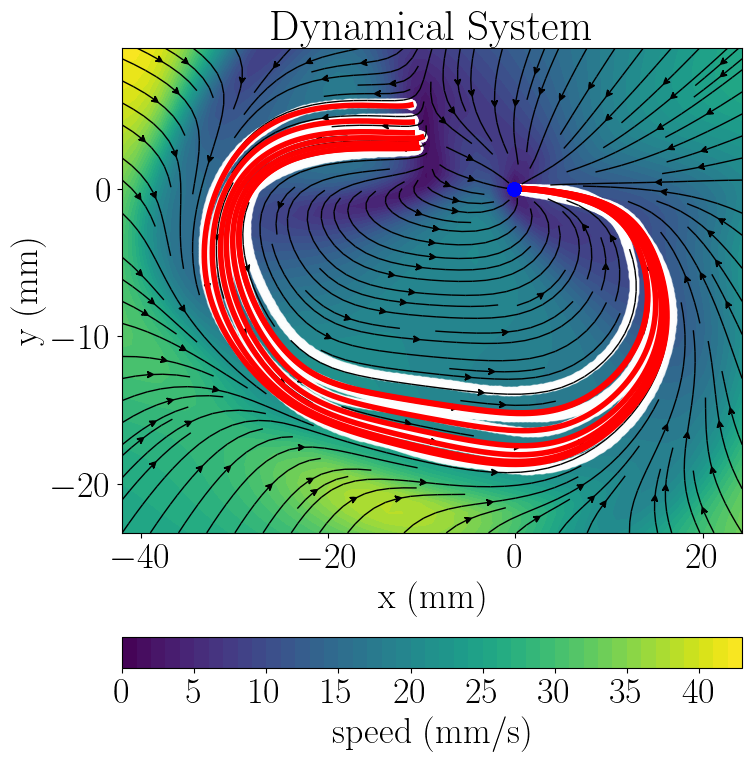

Saving image to results_analysis/LASA_1st_order_2D_euc_boundary_23.pdf...


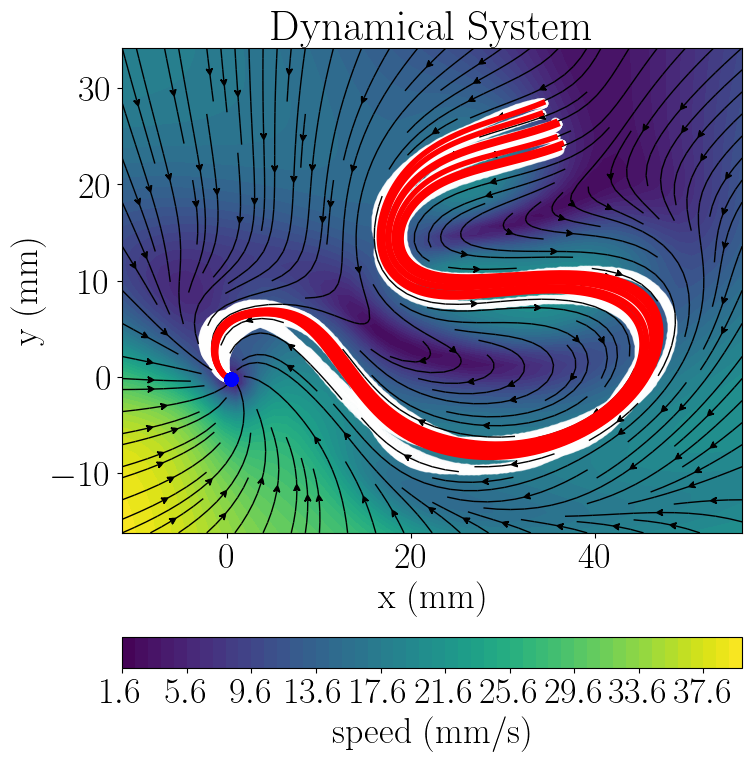

Saving image to results_analysis/LASA_1st_order_2D_euc_boundary_25.pdf...


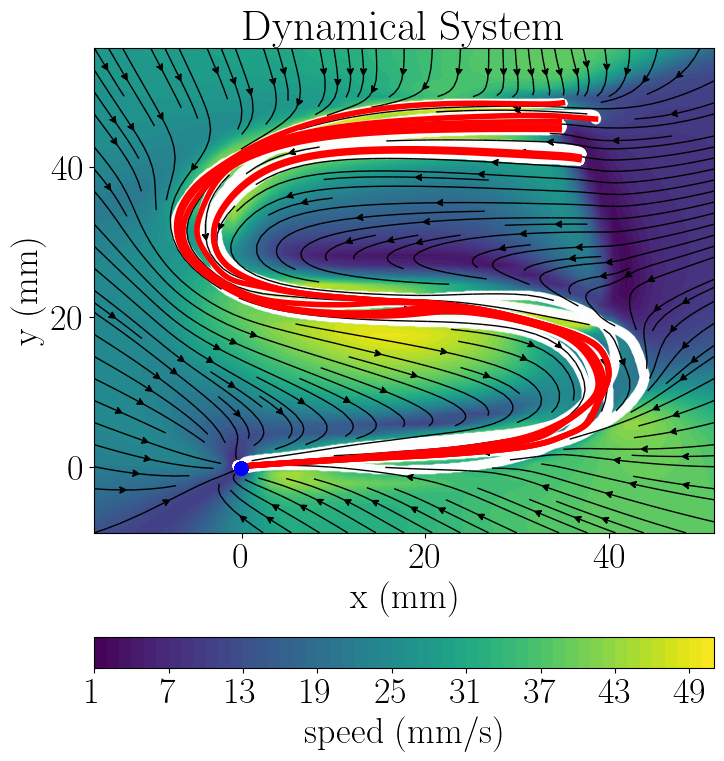

Saving image to results_analysis/LASA_1st_order_behavioral_cloning_2D_3.pdf...


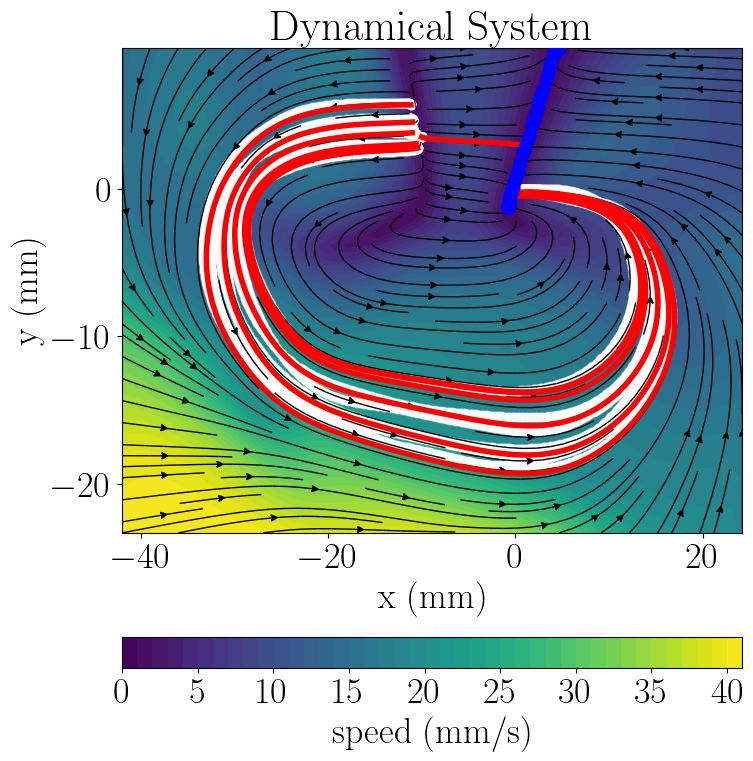

Saving image to results_analysis/LASA_1st_order_behavioral_cloning_2D_23.pdf...


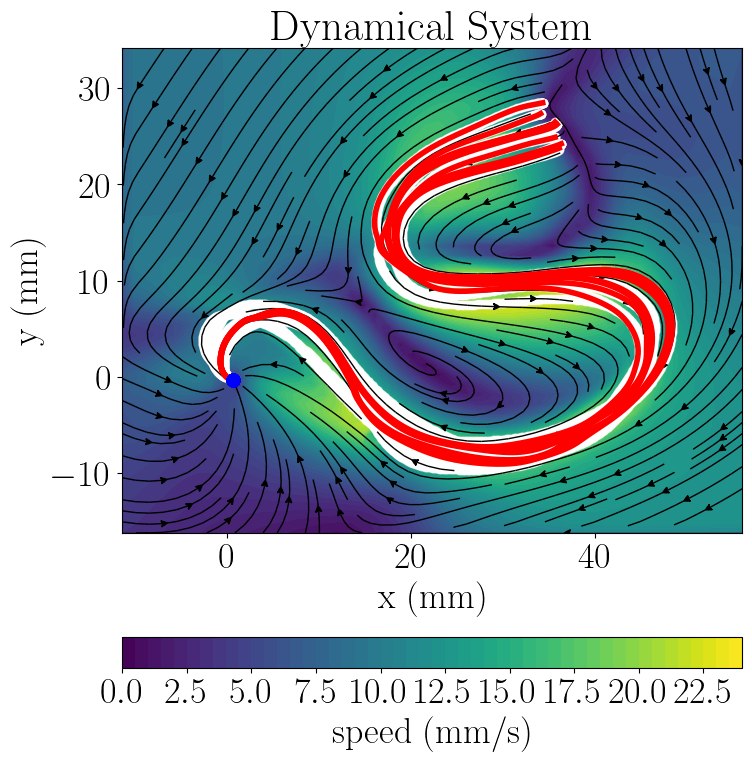

Saving image to results_analysis/LASA_1st_order_behavioral_cloning_2D_25.pdf...


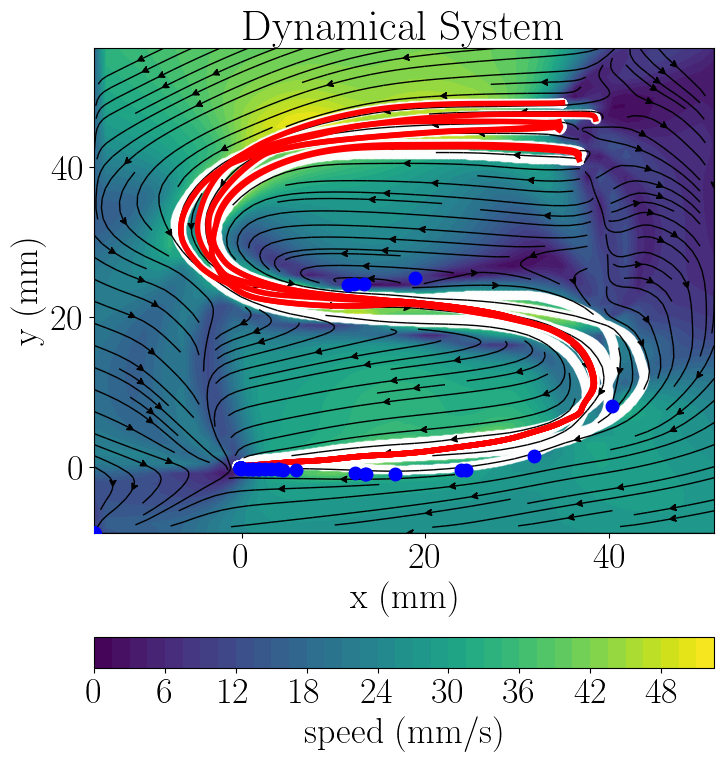

{'1st_order_2D': {'RMSE': [], 'DTWD': [], 'FD': [], 'n_spurious': []},
 '1st_order_2D_euc': {'RMSE': [], 'DTWD': [], 'FD': [], 'n_spurious': []},
 '1st_order_2D_boundary': {'RMSE': [], 'DTWD': [], 'FD': [], 'n_spurious': []},
 '1st_order_2D_euc_boundary': {'RMSE': [],
  'DTWD': [],
  'FD': [],
  'n_spurious': []},
 '1st_order_behavioral_cloning_2D': {'RMSE': [],
  'DTWD': [],
  'FD': [],
  'n_spurious': []}}

In [5]:
demos_ids = [3, 23, 25]
evaluate_system_comparison(quanti_eval, quali_eval, models_names, dataset_name, demos_ids, density, simulated_trajectory_length, results_base_directory)

### 1.2) Quantitative comparison

In [2]:
plt.rcdefaults()
plt.rcParams.update({"text.usetex": True, 
                     "font.family": "Times New Roman", 
                     "font.size": 32})
dataset_name = 'LASA'
simulated_trajectory_length = 2500
density = 50
models_names = ['1st_order_2D', '1st_order_2D_euc', '1st_order_2D_boundary', '1st_order_2D_euc_boundary', '1st_order_behavioral_cloning_2D']
quanti_eval = True
quali_eval = False
demos_ids = list(range(30))
fixed_point_iteration_thr = 1
save_name = 'quanti_metrics_LASA'

In [3]:
metrics = evaluate_system_comparison(quanti_eval, quali_eval, models_names, dataset_name, demos_ids, density, simulated_trajectory_length, results_base_directory, fixed_point_iteration_thr=fixed_point_iteration_thr, save_name=save_name)

Evaluating model: 1st_order_2D; demo: 0
Evaluating model: 1st_order_2D; demo: 1
Evaluating model: 1st_order_2D; demo: 2
Evaluating model: 1st_order_2D; demo: 3
Evaluating model: 1st_order_2D; demo: 4
Evaluating model: 1st_order_2D; demo: 5
Evaluating model: 1st_order_2D; demo: 6
Evaluating model: 1st_order_2D; demo: 7
Evaluating model: 1st_order_2D; demo: 8
Evaluating model: 1st_order_2D; demo: 9
Evaluating model: 1st_order_2D; demo: 10
Evaluating model: 1st_order_2D; demo: 11
Evaluating model: 1st_order_2D; demo: 12
Evaluating model: 1st_order_2D; demo: 13
Evaluating model: 1st_order_2D; demo: 14
Evaluating model: 1st_order_2D; demo: 15
Evaluating model: 1st_order_2D; demo: 16
Evaluating model: 1st_order_2D; demo: 17
Evaluating model: 1st_order_2D; demo: 18
Evaluating model: 1st_order_2D; demo: 19
Evaluating model: 1st_order_2D; demo: 20
Evaluating model: 1st_order_2D; demo: 21
Evaluating model: 1st_order_2D; demo: 22
Evaluating model: 1st_order_2D; demo: 23
Evaluating model: 1st_orde

#### Plot results

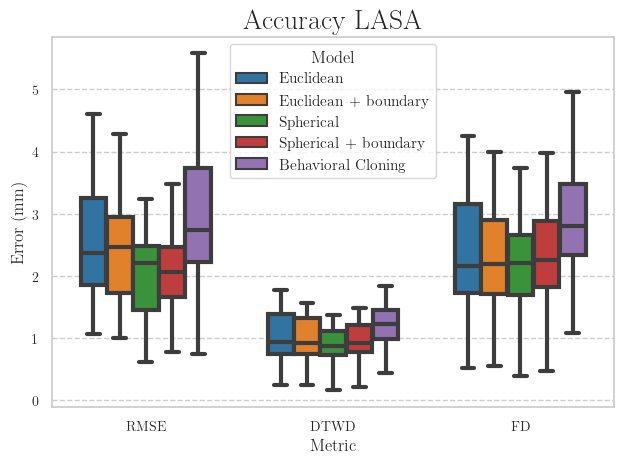

In [4]:
with open('results_analysis/saved_metrics/%s.pk' % save_name, 'rb') as input_file:
    metrics = pickle.load(input_file)
    
# Values
models_names = ['Euclidean', 'Euclidean + boundary', 'Spherical', 
                'Spherical + boundary', 'Behavioral Cloning']

metrics_names = ['RMSE', 'DTWD', 'FD']
title = 'Accuracy LASA'

metrics_models = [metrics['1st_order_2D_euc'],
                  metrics['1st_order_2D_euc_boundary'],
                  metrics['1st_order_2D'],
                  metrics['1st_order_2D_boundary'],
                  metrics['1st_order_behavioral_cloning_2D']]

# Box plot
plot_accuracy_metrics(models_names, metrics_names, metrics_models, title)

## 2) Experiments LASA S2

### 2.1) Circle distance

In [22]:
dataset_name = 'LASA_S2'
model_name = '1st_order_S2'

#### Get camera parameters

In [60]:
demo_id = 1
model = 36000
get_camera_parameters(dataset_name, model_name, demo_id, model)

Dash is running on http://127.0.0.1:8050/

 * Serving Flask app '__main__'
 * Debug mode: on


#### Plot S2 learned models

In [14]:
demo_id = 3
model = 41000

camera = dict(
    eye=dict(x=-0.3867641339055873, y=-0.6413379069260574, z=1.2511279104657411),
    center=dict(x=0, y=0, z=0),
    up=dict(x=0, y=0, z=1)
)

plot_LASA_S2(dataset_name, model_name, demo_id, model, camera)

In [23]:
demo_id = 20
model = 23000

camera = dict(
    eye=dict(x=0.729991658758739, y=0.5637176015592403, z=0.8742963291495074),
    center=dict(x=0, y=0, z=0),
    up=dict(x=0, y=0, z=1)
)

plot_LASA_S2(dataset_name, model_name, demo_id, model, camera)

In [24]:
demo_id = 22
model = 36000

camera = dict(
    eye=dict(x=-0.8638573933478987, y=-0.766267629069433, z=0.7275651938144199),
    center=dict(x=0, y=0, z=0),
    up=dict(x=0, y=0, z=1)
)

plot_LASA_S2(dataset_name, model_name, demo_id, model, camera)

### 2.2) LASA S2 Euclidean distance

In [15]:
dataset_name = 'LASA_S2'
model_name = '1st_order_S2_euc'

#### Plot S2 learned models

In [16]:
demo_id = 3
model = 41000

camera = dict(
    eye=dict(x=-0.3867641339055873, y=-0.6413379069260574, z=1.2511279104657411),
    center=dict(x=0, y=0, z=0),
    up=dict(x=0, y=0, z=1)
)

plot_LASA_S2(dataset_name, model_name, demo_id, model, camera)

In [17]:
demo_id = 20
model = 23000

camera = dict(
    eye=dict(x=0.729991658758739, y=0.5637176015592403, z=0.8742963291495074),
    center=dict(x=0, y=0, z=0),
    up=dict(x=0, y=0, z=1)
)

plot_LASA_S2(dataset_name, model_name, demo_id, model, camera)

In [19]:
demo_id = 22
model = 36000

camera = dict(
    eye=dict(x=-0.8638573933478987, y=-0.766267629069433, z=0.7275651938144199),
    center=dict(x=0, y=0, z=0),
    up=dict(x=0, y=0, z=1)
)

plot_LASA_S2(dataset_name, model_name, demo_id, model, camera)

### 2.3) Quantitative comparison

In [8]:
plt.rcdefaults()
plt.rcParams.update({"text.usetex": True, 
                     "font.family": "Times New Roman", 
                     "font.size": 32})
dataset_name = 'LASA_S2'
simulated_trajectory_length = 2500
density = 50
models_names = ['1st_order_S2', '1st_order_S2_euc', '1st_order_behavioral_cloning_S2']
quanti_eval = True
quali_eval = False
demos_ids = list(range(24))
fixed_point_iteration_thr = 1
save_name = 'quanti_metrics_LASA_S2'

In [9]:
metrics = evaluate_system_comparison(quanti_eval, quali_eval, models_names, dataset_name, demos_ids, density, simulated_trajectory_length, results_base_directory, fixed_point_iteration_thr=fixed_point_iteration_thr, save_name=save_name)

Evaluating model: 1st_order_S2; demo: 0
Evaluating model: 1st_order_S2; demo: 1
Evaluating model: 1st_order_S2; demo: 2
Evaluating model: 1st_order_S2; demo: 3
Evaluating model: 1st_order_S2; demo: 4
Evaluating model: 1st_order_S2; demo: 5
Evaluating model: 1st_order_S2; demo: 6
Evaluating model: 1st_order_S2; demo: 7
Evaluating model: 1st_order_S2; demo: 8
Evaluating model: 1st_order_S2; demo: 9
Evaluating model: 1st_order_S2; demo: 10
Evaluating model: 1st_order_S2; demo: 11
Evaluating model: 1st_order_S2; demo: 12
Evaluating model: 1st_order_S2; demo: 13
Evaluating model: 1st_order_S2; demo: 14
Evaluating model: 1st_order_S2; demo: 15
Evaluating model: 1st_order_S2; demo: 16
Evaluating model: 1st_order_S2; demo: 17
Evaluating model: 1st_order_S2; demo: 18
Evaluating model: 1st_order_S2; demo: 19
Evaluating model: 1st_order_S2; demo: 20
Evaluating model: 1st_order_S2; demo: 21
Evaluating model: 1st_order_S2; demo: 22
Evaluating model: 1st_order_S2; demo: 23
Evaluating model: 1st_orde

#### Plot results

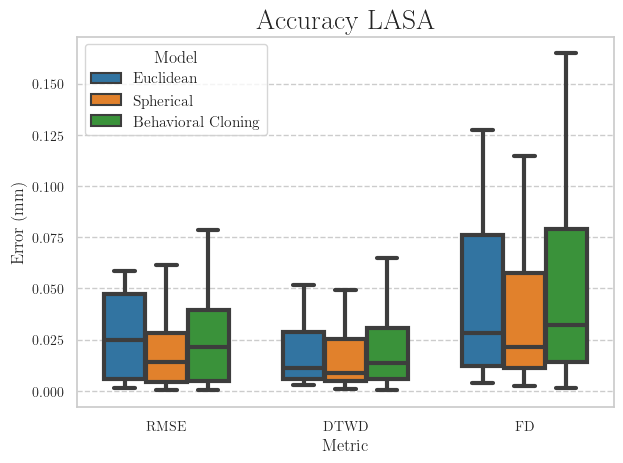

In [11]:
with open('results_analysis/saved_metrics/%s.pk' % save_name, 'rb') as input_file:
    metrics = pickle.load(input_file)
    
# Values
models_names = ['Euclidean', 'Spherical', 'Behavioral Cloning']

metrics_names = ['RMSE', 'DTWD', 'FD']
title = 'Accuracy LASA'

metrics_models = [metrics['1st_order_S2_euc'],
                  metrics['1st_order_S2'],
                  metrics['1st_order_behavioral_cloning_S2']]

# Box plot
plot_accuracy_metrics(models_names, metrics_names, metrics_models, title)

In [12]:
metrics

{'1st_order_S2': {'RMSE': [0.0044768917497491475,
   0.0033871451878514087,
   0.00411427184795922,
   0.004004931528679767,
   0.04732844688266847,
   0.004877137608861541,
   0.024008988427524205,
   0.000894202685380022,
   0.023876763294293446,
   0.00563682626563201,
   0.04057503329264274,
   0.011666545343299755,
   0.06150821811229238,
   0.0003976351638673295,
   0.05019892218312032,
   0.015949415457977085,
   0.053640898192998804,
   0.0006186668128766562,
   0.005929896599969749,
   0.003242415696534745,
   0.0786917072782581,
   0.020889357130500025,
   0.02114559932513656,
   0.02308099945649134],
  'DTWD': [0.004262339980012862,
   0.005461403965422427,
   0.0035106902765788053,
   0.005787208189478567,
   0.04033960281986186,
   0.0057070441549382294,
   0.024340406811802242,
   0.0013915668181265172,
   0.018602238764719625,
   0.0035857493403742974,
   0.031224458926486866,
   0.007529962662653618,
   0.04934282992105641,
   0.0006332155276352665,
   0.042131803325616